In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import janitor
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 500)

import os
import yfinance as yf

## Graphs librairies
import plotly.figure_factory as ff
#import plotly.graph_objects as go
import plotly.express as px

### Downloading all stocks data

* I will download the below tickers
    * APPN: Appian Corp
    * BMGAX: BlackRock Mid-Cap
    * BREAX: BlackRock International 
    * CRWD:  CrowdStrike Holdings, Inc
    * ETSY: Etsy, Inc
    * FVRR: Fiverr International
    * GSPC: S&P500
    * INTU: Intuit, Inc
    * JD: JD.com, Inc
    * JMIA: Jumia Technology
    * LMND: Lemonade, Inc.
    * MDDVX: BlackRock Equity Dividend
    * MTCH: Match Group, Inc
    * NFLX: Netflix, Inc
    * OKTA: Okta, Inc
    * SFIX: Stich Fix, Inc
    * TTD: The Trade Desk, Inc.

In [5]:
# Creating a list of all stocks to downloas

tickers= ["APPN","BMGAX","BREAX","CRWD","ETSY","FVRR","^GSPC","INTU",
          "JD","JMIA","LMND","MDDVX","MTCH","NFLX","OKTA","SFIX","TTD"]

In [27]:
# Download data from 2015

df_stocks= yf.download(tickers, 
                      start='2015-01-01',
                      end='2020-12-31',
                       #group_by='Close',
                      progress=True)

[*********************100%***********************]  17 of 17 completed


In [7]:
print(df_stocks.shape)
df_stocks.head()

(1510, 102)


Adj Close                                                  \
                APPN      BMGAX      BREAX CRWD ETSY FVRR       INTU   
Date                                                                   
2015-01-02       NaN  12.694740  22.633383  NaN  NaN  NaN  86.049614   
2015-01-05       NaN  12.497784  22.139267  NaN  NaN  NaN  85.709976   
2015-01-06       NaN  12.282923  21.903271  NaN  NaN  NaN  83.077850   
2015-01-07       NaN  12.479878  22.058142  NaN  NaN  NaN  83.891502   
2015-01-08       NaN  12.694740  22.441637  NaN  NaN  NaN  85.017357   

                                                                            \
                   JD JMIA LMND      MDDVX       MTCH       NFLX OKTA SFIX   
Date                                                                         
2015-01-02  24.020000  NaN  NaN  12.297342  16.232864  49.848572  NaN  NaN   
2015-01-05  24.580000  NaN  NaN  12.060093  16.138641  47.311428  NaN  NaN   
2015-01-06  24.530001  NaN  NaN  11.941474  16.197866  46.501427  NaN  NaN   
2015-01-07  24.809999  NaN  NaN  12.069983  16.168255  46.742859  NaN  NaN   
2015-01-08  25.080000  NaN  NaN  12.277574  16.563982  47.779999  NaN  NaN   

                            Close                                              \
           TTD        ^GSPC  APPN  BMGAX      BREAX CRWD ETSY FVRR       INTU   
Date                                                                            
2015-01-02 NaN  2058.199951   NaN  14.18  30.690001  NaN  NaN  NaN  91.209999   
2015-01-05 NaN  2020.579956   NaN  13.96  30.020000  NaN  NaN  NaN  90.849998   
2015-01-06 NaN  2002.609985   NaN  13.72  29.700001  NaN  NaN  NaN  88.059998   
2015-01-07 NaN  2025.900024   NaN  13.94  29.910000  NaN  NaN  NaN  88.669998   
2015-01-08 NaN  2062.139893   NaN  14.18  30.430000  NaN  NaN  NaN  89.860001   

                                                                            \
                   JD JMIA LMND      MDDVX       MTCH       NFLX OKTA SFIX   
Date                                                                         
2015-01-02  24.020000  NaN  NaN  24.879999  17.218733  49.848572  NaN  NaN   
2015-01-05  24.580000  NaN  NaN  24.400000  17.118790  47.311428  NaN  NaN   
2015-01-06  24.530001  NaN  NaN  24.160000  17.181610  46.501427  NaN  NaN   
2015-01-07  24.809999  NaN  NaN  24.420000  17.150200  46.742859  NaN  NaN   
2015-01-08  25.080000  NaN  NaN  24.840000  17.569960  47.779999  NaN  NaN   

                            High                                              \
           TTD        ^GSPC APPN  BMGAX      BREAX CRWD ETSY FVRR       INTU   
Date                                                                           
2015-01-02 NaN  2058.199951  NaN  14.18  30.690001  NaN  NaN  NaN  93.160004   
2015-01-05 NaN  2020.579956  NaN  13.96  30.020000  NaN  NaN  NaN  91.339996   
2015-01-06 NaN  2002.609985  NaN  13.72  29.700001  NaN  NaN  NaN  91.199997   
2015-01-07 NaN  2025.900024  NaN  13.94  29.910000  NaN  NaN  NaN  89.040001   
2015-01-08 NaN  2062.139893  NaN  14.18  30.430000  NaN  NaN  NaN  90.629997   

                                                                            \
                   JD JMIA LMND      MDDVX       MTCH       NFLX OKTA SFIX   
Date                                                                         
2015-01-02  24.110001  NaN  NaN  24.879999  17.681324  50.331429  NaN  NaN   
2015-01-05  24.950001  NaN  NaN  24.400000  17.227299  49.258572  NaN  NaN   
2015-01-06  25.010000  NaN  NaN  24.160000  17.347231  47.639999  NaN  NaN   
2015-01-07  25.090000  NaN  NaN  24.420000  17.258709  47.421429  NaN  NaN   
2015-01-08  25.290001  NaN  NaN  24.840000  17.635637  47.835712  NaN  NaN   

                             Low                                              \
           TTD        ^GSPC APPN  BMGAX      BREAX CRWD ETSY FVRR       INTU   
Date                                                                           
2015-01-02 NaN  2072.360107  

In [8]:
df_stocks.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1510 entries, 2015-01-02 to 2020-12-30
Columns: 102 entries, ('Adj Close', 'APPN') to ('Volume', '^GSPC')
dtypes: float64(94), int64(8)
memory usage: 1.2 MB


In [9]:
df_stocks.columns

MultiIndex([('Adj Close',  'APPN'),
            ('Adj Close', 'BMGAX'),
            ('Adj Close', 'BREAX'),
            ('Adj Close',  'CRWD'),
            ('Adj Close',  'ETSY'),
            ('Adj Close',  'FVRR'),
            ('Adj Close',  'INTU'),
            ('Adj Close',    'JD'),
            ('Adj Close',  'JMIA'),
            ('Adj Close',  'LMND'),
            ...
            (   'Volume',    'JD'),
            (   'Volume',  'JMIA'),
            (   'Volume',  'LMND'),
            (   'Volume', 'MDDVX'),
            (   'Volume',  'MTCH'),
            (   'Volume',  'NFLX'),
            (   'Volume',  'OKTA'),
            (   'Volume',  'SFIX'),
            (   'Volume',   'TTD'),
            (   'Volume', '^GSPC')],
           length=102)

#### Drop all other columns and keep only close

In [10]:
## make copy
stocks_df= df_stocks.copy()

In [11]:
stocks_df= stocks_df[[('Close','APPN'),('Close','BMGAX'),('Close','BREAX'),('Close','CRWD'),('Close','ETSY'),
                 ('Close','FVRR'),('Close','^GSPC'),('Close','INTU'),('Close','JD'),('Close','JMIA'),
                 ('Close','LMND'),('Close','MDDVX'),('Close','MTCH'),('Close','NFLX'),('Close','OKTA'),
                 ('Close','SFIX'),('Close','TTD')
                ]]
stocks_df.head()

Close                                                           \
            APPN  BMGAX      BREAX CRWD ETSY FVRR        ^GSPC       INTU   
Date                                                                        
2015-01-02   NaN  14.18  30.690001  NaN  NaN  NaN  2058.199951  91.209999   
2015-01-05   NaN  13.96  30.020000  NaN  NaN  NaN  2020.579956  90.849998   
2015-01-06   NaN  13.72  29.700001  NaN  NaN  NaN  2002.609985  88.059998   
2015-01-07   NaN  13.94  29.910000  NaN  NaN  NaN  2025.900024  88.669998   
2015-01-08   NaN  14.18  30.430000  NaN  NaN  NaN  2062.139893  89.860001   

                                                                                
                   JD JMIA LMND      MDDVX       MTCH       NFLX OKTA SFIX TTD  
Date                                                                            
2015-01-02  24.020000  NaN  NaN  24.879999  17.218733  49.848572  NaN  NaN NaN  
2015-01-05  24.580000  NaN  NaN  24.400000  17.118790  47.311428  NaN  NaN NaN  
2015-01-06  24.530001  NaN  NaN  24.160000  17.181610  46.501427  NaN  NaN NaN  
2015-01-07  24.809999  NaN  NaN  24.420000  17.150200  46.742859  NaN  NaN NaN  
2015-01-08  25.080000  NaN  NaN  24.840000  17.569960  47.779999  NaN  NaN NaN

In [12]:
## Set all the columns as index

stocks_df.columns = stocks_df.columns.to_flat_index()


## Reset Index
stocks_df=stocks_df.reset_index()

stocks_df.head()

,Date,"(Close, APPN)","(Close, BMGAX)","(Close, BREAX)","(Close, CRWD)","(Close, ETSY)","(Close, FVRR)","(Close, ^GSPC)","(Close, INTU)","(Close, JD)","(Close, JMIA)","(Close, LMND)","(Close, MDDVX)","(Close, MTCH)","(Close, NFLX)","(Close, OKTA)","(Close, SFIX)","(Close, TTD)"
0,2015-01-02,NaN,14.18,30.690001,NaN,NaN,NaN,2058.199951,91.209999,24.020000,NaN,NaN,24.879999,17.218733,49.848572,NaN,NaN,NaN
1,2015-01-05,NaN,13.96,30.020000,NaN,NaN,NaN,2020.579956,90.849998,24.580000,NaN,NaN,24.400000,17.118790,47.311428,NaN,NaN,NaN
2,2015-01-06,NaN,13.72,29.700001,NaN,NaN,NaN,2002.609985,88.059998,24.530001,NaN,NaN,24.160000,17.181610,46.501427,NaN,NaN,NaN
3,2015-01-07,NaN,13.94,29.910000,NaN,NaN,NaN,2025.900024,88.669998,24.809999,NaN,NaN,24.420000,17.150200,46.742859,NaN,NaN,NaN
4,2015-01-08,NaN,14.18,30.430000,NaN,NaN,NaN,2062.139893,89.860001,25.080000,NaN,NaN,24.840000,17.569960,47.779999,NaN,NaN,NaN


In [13]:
stocks_df.columns

Index([            'Date',  ('Close', 'APPN'), ('Close', 'BMGAX'),
       ('Close', 'BREAX'),  ('Close', 'CRWD'),  ('Close', 'ETSY'),
        ('Close', 'FVRR'), ('Close', '^GSPC'),  ('Close', 'INTU'),
          ('Close', 'JD'),  ('Close', 'JMIA'),  ('Close', 'LMND'),
       ('Close', 'MDDVX'),  ('Close', 'MTCH'),  ('Close', 'NFLX'),
        ('Close', 'OKTA'),  ('Close', 'SFIX'),   ('Close', 'TTD')],
      dtype='object')

In [14]:
## Renaming all columns (Remove close)

stocks_df=(stocks_df.rename_column(('Close', 'APPN'),'APPN')
           .rename_column(('Close', 'BMGAX'),'BMGAX')
           .rename_column(('Close', 'BREAX'),'BREAX')
           .rename_column(('Close', 'CRWD'),'CRWD')
           .rename_column(('Close', 'ETSY'),'ETSY')
           .rename_column(('Close', 'FVRR'),'FVRR')
           .rename_column(('Close', '^GSPC'),'SP500')
           .rename_column(('Close', 'INTU'),'INTU')
           .rename_column(('Close', 'JD'),'JD')
           .rename_column(('Close', 'JMIA'),'JMIA')
           .rename_column(('Close', 'LMND'),'LMND')
           .rename_column(('Close', 'MDDVX'),'MDDVX')
           .rename_column(('Close', 'MTCH'),'MTCH')
           .rename_column(('Close', 'NFLX'),'NFLX')
           .rename_column(('Close', 'OKTA'),'OKTA')
           .rename_column(('Close', 'SFIX'),'SFIX')
           .rename_column(('Close', 'TTD'),'TTD')
           
)

In [15]:
## Verification

stocks_df.head()

,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
0,2015-01-02,NaN,14.18,30.690001,NaN,NaN,NaN,2058.199951,91.209999,24.020000,NaN,NaN,24.879999,17.218733,49.848572,NaN,NaN,NaN
1,2015-01-05,NaN,13.96,30.020000,NaN,NaN,NaN,2020.579956,90.849998,24.580000,NaN,NaN,24.400000,17.118790,47.311428,NaN,NaN,NaN
2,2015-01-06,NaN,13.72,29.700001,NaN,NaN,NaN,2002.609985,88.059998,24.530001,NaN,NaN,24.160000,17.181610,46.501427,NaN,NaN,NaN
3,2015-01-07,NaN,13.94,29.910000,NaN,NaN,NaN,2025.900024,88.669998,24.809999,NaN,NaN,24.420000,17.150200,46.742859,NaN,NaN,NaN
4,2015-01-08,NaN,14.18,30.430000,NaN,NaN,NaN,2062.139893,89.860001,25.080000,NaN,NaN,24.840000,17.569960,47.779999,NaN,NaN,NaN


In [16]:
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1510 entries, 0 to 1509
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1510 non-null   datetime64[ns]
 1   APPN    907 non-null    float64       
 2   BMGAX   1510 non-null   float64       
 3   BREAX   1510 non-null   float64       
 4   CRWD    393 non-null    float64       
 5   ETSY    1439 non-null   float64       
 6   FVRR    392 non-null    float64       
 7   SP500   1510 non-null   float64       
 8   INTU    1510 non-null   float64       
 9   JD      1510 non-null   float64       
 10  JMIA    434 non-null    float64       
 11  LMND    126 non-null    float64       
 12  MDDVX   1510 non-null   float64       
 13  MTCH    1510 non-null   float64       
 14  NFLX    1510 non-null   float64       
 15  OKTA    940 non-null    float64       
 16  SFIX    784 non-null    float64       
 17  TTD     1077 non-null   float64       
dtypes: datet

### Part I
* Now the data is in the wanted format, i will do some EDA
* Plot, daily returned, correlation between daily return

In [15]:
## Sort dataset from latest date
stocks_df.sort_values('Date', ascending=False,inplace=True)

stocks_df.head()

,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
1509,2020-12-30,161.500000,37.830002,30.760000,210.289993,183.179993,205.410004,3732.040039,375.549988,89.519997,42.560001,129.889999,20.070000,152.000000,524.590027,260.519989,61.830002,818.000000
1508,2020-12-29,153.809998,37.669998,30.700001,205.929993,177.009995,197.979996,3727.040039,378.329987,86.139999,39.919998,118.339996,20.010000,150.220001,530.869995,261.750000,61.730000,820.289978
1507,2020-12-28,154.960007,37.919998,30.430000,212.550003,178.119995,194.149994,3735.360107,381.119995,81.610001,40.360001,107.669998,20.040001,150.080002,519.119995,262.750000,63.200001,832.619995
1506,2020-12-24,157.979996,38.200001,30.230000,221.119995,190.309998,211.559998,3703.060059,381.160004,84.489998,43.619999,125.110001,19.920000,152.080002,513.969971,275.600006,69.269997,931.770020
1505,2020-12-23,157.309998,38.110001,30.090000,223.500000,190.169998,216.279999,3690.010010,376.920013,85.459999,46.439999,134.449997,19.910000,153.389999,514.479980,272.519989,68.660004,923.989990


In [16]:
## Print all stocks
[x for x in stocks_df.columns[1:]]

['APPN',
 'BMGAX',
 'BREAX',
 'CRWD',
 'ETSY',
 'FVRR',
 'SP500',
 'INTU',
 'JD',
 'JMIA',
 'LMND',
 'MDDVX',
 'MTCH',
 'NFLX',
 'OKTA',
 'SFIX',
 'TTD']

In [17]:
## info

stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1510 entries, 1509 to 0
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1510 non-null   datetime64[ns]
 1   APPN    907 non-null    float64       
 2   BMGAX   1510 non-null   float64       
 3   BREAX   1510 non-null   float64       
 4   CRWD    393 non-null    float64       
 5   ETSY    1439 non-null   float64       
 6   FVRR    392 non-null    float64       
 7   SP500   1510 non-null   float64       
 8   INTU    1510 non-null   float64       
 9   JD      1510 non-null   float64       
 10  JMIA    434 non-null    float64       
 11  LMND    126 non-null    float64       
 12  MDDVX   1510 non-null   float64       
 13  MTCH    1510 non-null   float64       
 14  NFLX    1510 non-null   float64       
 15  OKTA    940 non-null    float64       
 16  SFIX    784 non-null    float64       
 17  TTD     1077 non-null   float64       
dtypes: datet

In [18]:
## Find % of missing data

Total= stocks_df.isnull().sum().sort_values(ascending=False)
Percentage= stocks_df.isnull().sum()/stocks_df.count().sort_values(ascending=False)
Missing= pd.concat([Total, Percentage], keys=['Total', 'Percentage'], axis=1)

## Display
Missing

,Total,Percentage
LMND,1384,10.984127
FVRR,1118,2.852041
CRWD,1117,2.842239
JMIA,1076,2.479263
SFIX,726,0.926020
APPN,603,0.664829
OKTA,570,0.606383
TTD,433,0.402043
ETSY,71,0.049340
BMGAX,0,0.000000


In [19]:
# describe Find max and min 
stocks_df.describe()

,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
count,907.000000,1510.000000,1510.000000,393.000000,1439.000000,392.000000,1510.000000,1510.000000,1510.000000,434.000000,126.000000,1510.000000,1510.000000,1510.000000,940.000000,784.000000,1077.000000
mean,41.193738,20.643536,28.874510,89.316870,39.948461,67.336046,2579.990985,182.122907,36.202613,13.179240,67.882540,21.679775,44.943622,242.319583,97.006755,25.989930,187.336133
std,24.139518,5.550098,2.429279,38.388088,36.418673,59.295922,451.964486,79.402611,14.603160,10.565691,18.427923,2.218826,30.098912,136.889852,66.401416,8.206898,186.849853
min,15.010000,12.090000,20.430000,33.009998,6.360000,17.680000,1829.079956,79.870003,19.270000,2.330000,46.900002,13.570000,11.410623,45.547142,21.950001,11.460000,22.799999
25%,27.665000,15.592500,27.120001,58.970001,13.425000,23.389999,2124.660034,107.457499,26.595000,5.675000,54.835001,20.120001,19.618789,110.107498,38.720001,21.552500,51.000000
50%,35.259998,19.850000,28.830000,76.500000,25.400000,30.554999,2584.900024,159.044998,31.570000,8.250000,62.950001,22.150000,37.511421,201.875000,81.344997,24.377500,131.880005
75%,47.994999,24.360001,30.507500,112.019997,54.620001,107.817499,2888.292542,256.759995,40.265000,17.990001,75.887499,23.240000,62.737009,353.324997,130.327507,27.895000,247.350006
max,193.869995,38.310001,34.540001,224.899994,197.380005,223.380005,3735.360107,381.160004,92.489998,47.669998,134.449997,25.250000,156.119995,556.549988,285.600006,71.650002,971.119995


### Plots

In [22]:
def plot(df, title):
    df.plot(x='Date', figsize=(25,12), linewidth=0.3, title=title)
    plt.grid()
    plt.legend()
    plt.show()
    

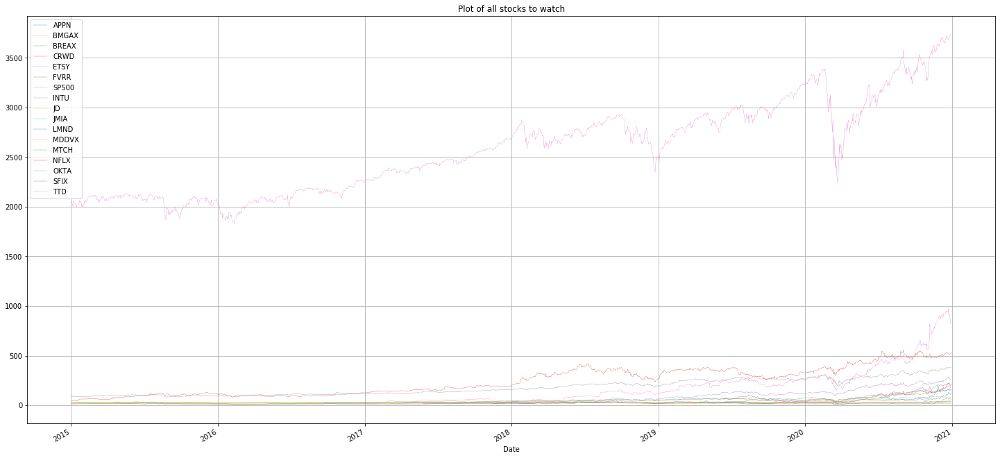

In [23]:
# call function
plot(stocks_df, 'Plot of all stocks to watch')

* Creating interactive plot for better visualization

In [18]:
## Creating interactive plot for better visualization

def interactive_plot(df, title):
    fig=px.line(title= title)
    
    for i in df.columns[1:]:
        fig.add_scatter(x=df['Date'], y=df[i], name=i)
    fig.show()    

In [21]:
interactive_plot(stocks_df, 'Interactive plot of stocks to watch')

Because of difference stocks price, it is hard to pinpoint the stocks that are performing better

Let normalize the stocks prices

In [19]:
# Function to normalize stock price
# Function divide every stock price by the price of its start time

def normalized(df):
    x=df.copy()
    
    for i in df.columns[1:]:
        x[i]= x[i]/x[i][0]
    return x

In [23]:
stocks_df_normalized= normalized(stocks_df)

# Head of normalized dataset

stocks_df_normalized.head()

,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
1509,2020-12-30,NaN,2.667842,1.002281,NaN,NaN,NaN,1.813254,4.117421,3.726894,NaN,NaN,0.806672,8.827595,10.523672,NaN,NaN,NaN
1508,2020-12-29,NaN,2.656558,1.000326,NaN,NaN,NaN,1.810825,4.147900,3.586178,NaN,NaN,0.804260,8.724219,10.649653,NaN,NaN,NaN
1507,2020-12-28,NaN,2.674189,0.991528,NaN,NaN,NaN,1.814867,4.178489,3.397585,NaN,NaN,0.805466,8.716089,10.413939,NaN,NaN,NaN
1506,2020-12-24,NaN,2.693935,0.985011,NaN,NaN,NaN,1.799174,4.178928,3.517485,NaN,NaN,0.800643,8.832241,10.310626,NaN,NaN,NaN
1505,2020-12-23,NaN,2.687588,0.980450,NaN,NaN,NaN,1.792834,4.132442,3.557868,NaN,NaN,0.800241,8.908321,10.320857,NaN,NaN,NaN


In [24]:
## Regular dataset

stocks_df.head()

,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
1509,2020-12-30,161.500000,37.830002,30.760000,210.289993,183.179993,205.410004,3732.040039,375.549988,89.519997,42.560001,129.889999,20.070000,152.000000,524.590027,260.519989,61.830002,818.000000
1508,2020-12-29,153.809998,37.669998,30.700001,205.929993,177.009995,197.979996,3727.040039,378.329987,86.139999,39.919998,118.339996,20.010000,150.220001,530.869995,261.750000,61.730000,820.289978
1507,2020-12-28,154.960007,37.919998,30.430000,212.550003,178.119995,194.149994,3735.360107,381.119995,81.610001,40.360001,107.669998,20.040001,150.080002,519.119995,262.750000,63.200001,832.619995
1506,2020-12-24,157.979996,38.200001,30.230000,221.119995,190.309998,211.559998,3703.060059,381.160004,84.489998,43.619999,125.110001,19.920000,152.080002,513.969971,275.600006,69.269997,931.770020
1505,2020-12-23,157.309998,38.110001,30.090000,223.500000,190.169998,216.279999,3690.010010,376.920013,85.459999,46.439999,134.449997,19.910000,153.389999,514.479980,272.519989,68.660004,923.989990


In [25]:
## plot interactive with normalized dataset

interactive_plot(stocks_df_normalized, 'Interactive plot of normalized stock to watch')

### Not all the stokcs have a start date of 2015-01-01. For that reason lot of the stocks were not normalized
### For the normalized stocks, Netflix and Match are the top performers, beating S&P500
### The worst stocks are MDDVX and BREAX

### Let find the daily return of all stocks

In [26]:
## function to calculate the daily return

def daily_return(df):
    df_daily_return= df.copy()
    
    # Loop through each columns (except date)
    for i in stocks_df.columns[1:]:
        # Look through each row
        for j in range(1, len(df)):
            df_daily_return[i][j]= ((df[i][j]-df[i][j-1])/df[i][j-1])*100 # calculate % of previous date
            
        df_daily_return[i][0] =0 # set the value of first raw to 0
        
    return df_daily_return
            
            

In [27]:
## Daily return

stocks_df_daily_return =daily_return(stocks_df)

stocks_df_daily_return.head(10)

,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
1509,2020-12-30,4.999677,0.424751,0.195438,2.117225,3.485678,3.752908,0.134155,-0.734808,3.923842,6.613235,9.760016,0.299847,1.184928,-1.182958,-0.469918,0.161999,-0.279167
1508,2020-12-29,-0.742133,-0.659283,0.887284,-3.114566,-0.623176,1.972703,-0.222738,-0.732055,5.550789,-1.090194,9.909908,-0.149704,0.093283,2.263446,-0.380590,-2.325951,-1.480870
1507,2020-12-28,-1.911627,-0.732991,0.661597,-3.875720,-6.405340,-8.229346,0.872253,-0.010497,-3.408684,-7.473632,-13.939735,0.602414,-1.315097,1.002009,-4.662557,-8.762807,-10.641040
1506,2020-12-24,0.425909,0.236159,0.465269,-1.064879,0.073618,-2.182357,0.353659,1.124905,-1.135035,-6.072351,-6.946818,0.050227,-0.854031,-0.099131,1.130199,0.888426,0.842004
1505,2020-12-23,-1.298787,-0.522059,0.467444,-0.622496,-3.652856,-3.178443,0.074581,-0.802692,3.225025,-2.580238,12.907285,1.065985,-1.748652,-2.436811,-4.579838,-4.173060,-4.853160
1504,2020-12-22,0.688617,1.295615,0.000000,6.764776,4.323471,0.680583,-0.207309,1.074670,2.666173,14.152299,9.177594,-0.555269,1.277977,-0.298719,3.651012,1.129150,3.804257
1503,2020-12-21,1.533034,-0.290010,-1.415400,3.386500,-0.817780,6.010799,-0.390628,-1.099680,-1.091622,-1.764291,2.403528,-0.602112,-0.593289,-1.036587,1.372286,1.199823,-1.678399
1502,2020-12-18,1.576752,0.877664,-0.295373,9.986505,1.414135,2.282279,-0.351112,-0.055222,-1.426672,8.610115,2.848595,-0.399800,4.248744,0.290859,0.162141,1.803120,0.965617
1501,2020-12-17,4.174298,2.090678,0.594250,3.036880,3.158939,1.292016,0.575765,2.995179,1.149569,-0.381780,7.471977,0.351052,-3.346325,1.537642,4.401186,3.522499,0.285197
1500,2020-12-16,2.447677,0.600932,0.698142,2.778255,2.553427,-1.865442,0.177280,2.449856,2.855342,8.266740,6.123345,0.050177,2.028638,0.971562,1.873407,3.312593,0.706222


### Plot daily return

In [28]:
interactive_plot(stocks_df_daily_return, 'Interactive daily return')

* TTD had the maximum % daily gain in March 2018: ~44%
* SFIX had the maximum % daily loss in October 2018: -35%
* S&P500 max % loss was on Match 2020: -12%

## Identify correlation between stocks daily return

In [29]:
# Drop date column and use corr() function

cm= stocks_df_daily_return.drop(columns=['Date']).corr()

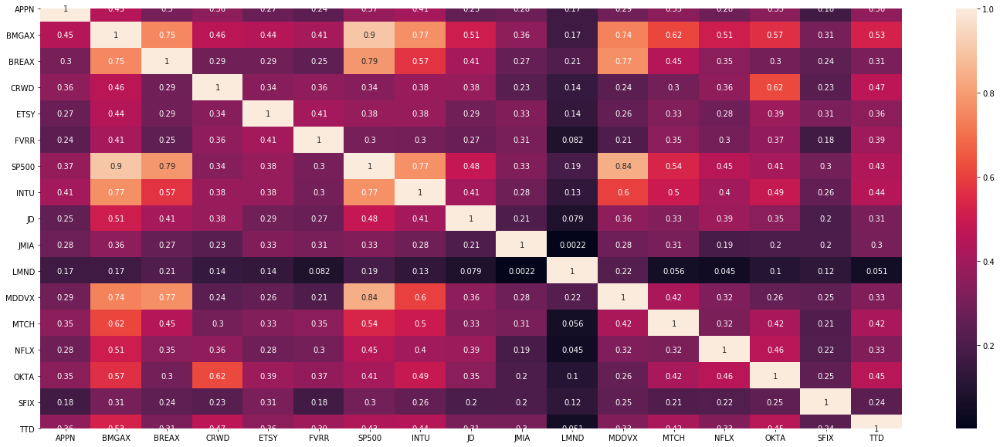

In [30]:
## plot of correlation
plt.figure(figsize=(25, 10))
sns.heatmap(cm, annot=True);


### Beside INTU the other stocks highlighly correlated to S&P500 are the BlackRock: BMGAX, BREAX, MDDVX

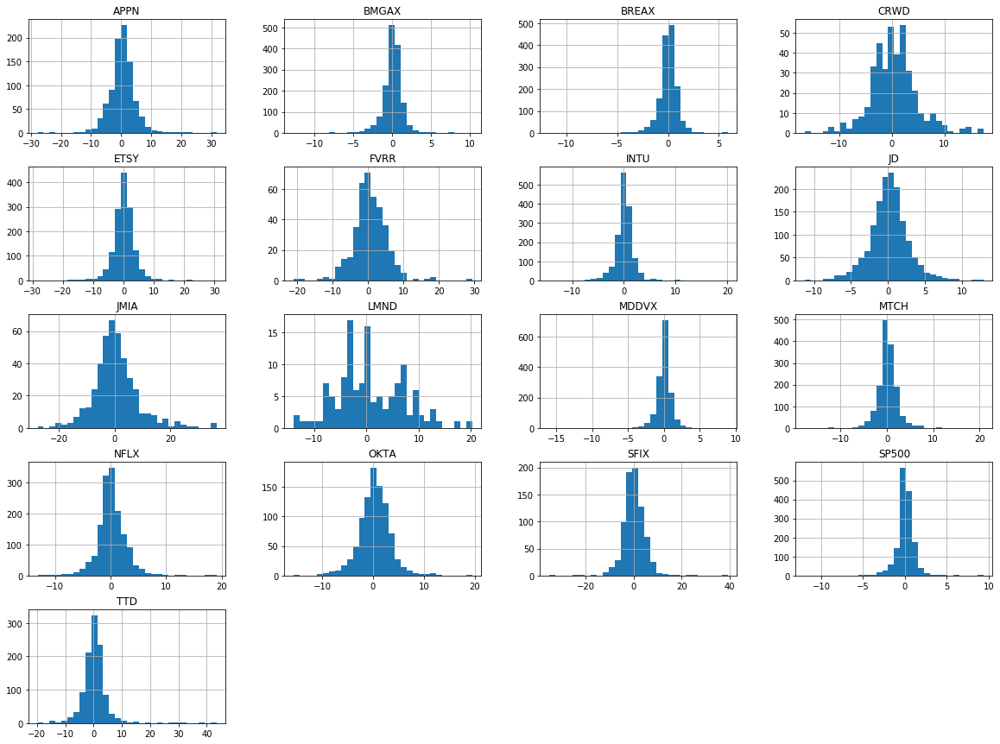

In [31]:
## Daily stock return histogram

stocks_df_daily_return.hist(figsize=(20,15), bins=30);

In [32]:
# Plot of interactive LMND since it doesn't look normally distributed

fig = px.histogram(stocks_df_daily_return, x="LMND")
fig.show()


### Identifying riskier stocks

In [33]:
# Make copy
df_hist= stocks_df_daily_return.copy()

## replace all nan by 0 
df_hist.fillna(0, inplace=True)

# Drop date columns
#df_hist= df_hist.drop(columns=['Date'])

# Loop through every columns except data
data= [df_hist[i] for i in df_hist.columns[1:]]

data


[1509    4.999677
 1508   -0.742133
 1507   -1.911627
 1506    0.425909
 1505   -1.298787
           ...   
 4       0.000000
 3       0.000000
 2       0.000000
 1       0.000000
 0       0.000000
 Name: APPN, Length: 1510, dtype: float64, 1509    0.424751
 1508   -0.659283
 1507   -0.732991
 1506    0.236159
 1505   -0.522059
           ...   
 4       1.721670
 3       1.603494
 2      -1.719196
 1      -1.551483
 0       0.000000
 Name: BMGAX, Length: 1510, dtype: float64, 1509    0.195438
 1508    0.887284
 1507    0.661597
 1506    0.465269
 1505    0.467444
           ...   
 4       1.738551
 3       0.707068
 2      -1.065955
 1      -2.183122
 0       0.000000
 Name: BREAX, Length: 1510, dtype: float64, 1509    2.117225
 1508   -3.114566
 1507   -3.875720
 1506   -1.064879
 1505   -0.622496
           ...   
 4       0.000000
 3       0.000000
 2       0.000000
 1       0.000000
 0       0.000000
 Name: CRWD, Length: 1510, dtype: float64, 1509    3.485678
 1508   -0.623176
 1

In [34]:
df_hist.tail()

,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
4,2015-01-08,0.0,1.721670,1.738551,0.0,0.0,0.0,1.788828,1.342058,1.088273,0.0,0.0,1.719902,2.447550,2.218820,0.0,0.0,0.0
3,2015-01-07,0.0,1.603494,0.707068,0.0,0.0,0.0,1.162984,0.692710,1.141454,0.0,0.0,1.076160,-0.182813,0.519193,0.0,0.0,0.0
2,2015-01-06,0.0,-1.719196,-1.065955,0.0,0.0,0.0,-0.889347,-3.070997,-0.203414,0.0,0.0,-0.983606,0.366968,-1.712063,0.0,0.0,0.0
1,2015-01-05,0.0,-1.551483,-2.183122,0.0,0.0,0.0,-1.827811,-0.394694,2.331388,0.0,0.0,-1.929259,-0.580433,-5.089702,0.0,0.0,0.0
0,2015-01-02,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0


In [35]:
fig = ff.create_distplot(data, df_hist.columns[1:])
fig.show()

In [ ]:
# From the bar chatrt, you can  see that TTD has the highest gain (43%)  and SFIX the highest loss (35%)

### Part II: 
* Start date will be 2020-01-01
* Asset allocation with specific weight (without SP500)
* Daily dollar and % return
* Cummulative, average gains
* Total of 252 trading weeks



In [39]:
## Save file


stocks_df.to_excel('Stocks_to_Watch.xlsx', index=False)

In [17]:
stocks_df.to_csv('Stocks_to_Watch.csv', index=False)

#### Set the start to 2020-01-01

In [37]:
print(stocks_df.shape)
stocks_df.tail()

(1510, 18)


,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
4,2015-01-08,NaN,14.18,30.430000,NaN,NaN,NaN,2062.139893,89.860001,25.080000,NaN,NaN,24.840000,17.569960,47.779999,NaN,NaN,NaN
3,2015-01-07,NaN,13.94,29.910000,NaN,NaN,NaN,2025.900024,88.669998,24.809999,NaN,NaN,24.420000,17.150200,46.742859,NaN,NaN,NaN
2,2015-01-06,NaN,13.72,29.700001,NaN,NaN,NaN,2002.609985,88.059998,24.530001,NaN,NaN,24.160000,17.181610,46.501427,NaN,NaN,NaN
1,2015-01-05,NaN,13.96,30.020000,NaN,NaN,NaN,2020.579956,90.849998,24.580000,NaN,NaN,24.400000,17.118790,47.311428,NaN,NaN,NaN
0,2015-01-02,NaN,14.18,30.690001,NaN,NaN,NaN,2058.199951,91.209999,24.020000,NaN,NaN,24.879999,17.218733,49.848572,NaN,NaN,NaN


In [20]:
stocks_df_cp = stocks_df.copy()

In [21]:
stocks_df_redu= stocks_df[stocks_df['Date']>='2020-01-01']

In [61]:
print(stocks_df_redu.shape)
stocks_df_redu.tail()

(252, 18)


,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,SP500,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
247,2020-12-23,157.309998,38.110001,30.090000,223.500000,190.169998,216.279999,3690.010010,376.920013,85.459999,46.439999,134.449997,19.910000,153.389999,514.479980,272.519989,68.660004,923.989990
248,2020-12-24,157.979996,38.200001,30.230000,221.119995,190.309998,211.559998,3703.060059,381.160004,84.489998,43.619999,125.110001,19.920000,152.080002,513.969971,275.600006,69.269997,931.770020
249,2020-12-28,154.960007,37.919998,30.430000,212.550003,178.119995,194.149994,3735.360107,381.119995,81.610001,40.360001,107.669998,20.040001,150.080002,519.119995,262.750000,63.200001,832.619995
250,2020-12-29,153.809998,37.669998,30.700001,205.929993,177.009995,197.979996,3727.040039,378.329987,86.139999,39.919998,118.339996,20.010000,150.220001,530.869995,261.750000,61.730000,820.289978
251,2020-12-30,161.500000,37.830002,30.760000,210.289993,183.179993,205.410004,3732.040039,375.549988,89.519997,42.560001,129.889999,20.070000,152.000000,524.590027,260.519989,61.830002,818.000000


### I want to invest 20K into the stock maket
* Let remove S&P500 since it is out of my budget

In [62]:
stocks_df_redu.drop(columns=['SP500'], inplace=True)

In [ ]:
### Saving reduce dataset (starting from 2020-01-01)
stocks_df_redu.to_excel('Reduced_Stocks_to_Watch.xlsx', index=False)

In [63]:
## Verification

print(stocks_df_redu.shape)
stocks_df_redu.head()

(252, 17)


,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
0,2020-01-02,38.779999,26.420000,28.730000,49.439999,45.189999,22.900000,266.160004,37.730000,6.60,NaN,20.92,72.895485,329.809998,117.309998,25.059999,271.450012
1,2020-01-03,38.130001,26.389999,28.629999,50.750000,44.900002,23.190001,264.380005,37.990002,6.51,NaN,20.77,72.504280,325.899994,118.290001,25.129999,271.910004
2,2020-01-06,38.889999,26.510000,28.700001,55.110001,44.834999,23.500000,266.410004,38.000000,6.40,NaN,20.83,72.598518,335.829987,123.430000,24.760000,277.910004
3,2020-01-07,39.020000,26.510000,28.610001,54.750000,45.779999,24.240000,266.470001,38.320000,6.31,NaN,20.75,73.058250,330.750000,122.889999,23.600000,280.279999
4,2020-01-08,40.110001,26.690001,28.650000,55.660000,45.005001,25.020000,272.880005,38.299999,6.25,NaN,20.83,73.917763,339.260010,125.550003,23.625000,285.200012


In [64]:
stocks_df_redu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252 entries, 0 to 251
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    252 non-null    datetime64[ns]
 1   APPN    252 non-null    float64       
 2   BMGAX   252 non-null    float64       
 3   BREAX   252 non-null    float64       
 4   CRWD    252 non-null    float64       
 5   ETSY    252 non-null    float64       
 6   FVRR    252 non-null    float64       
 7   INTU    252 non-null    float64       
 8   JD      252 non-null    float64       
 9   JMIA    252 non-null    float64       
 10  LMND    126 non-null    float64       
 11  MDDVX   252 non-null    float64       
 12  MTCH    252 non-null    float64       
 13  NFLX    252 non-null    float64       
 14  OKTA    252 non-null    float64       
 15  SFIX    252 non-null    float64       
 16  TTD     252 non-null    float64       
dtypes: datetime64[ns](1), float64(16)
memory usage: 33.6 K

In [65]:
## Normalize the reduced data to identify the performing stocks

stocks_df_redu_norm =normalized(stocks_df_redu)

stocks_df_redu_norm

,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,INTU,JD,JMIA,LMND,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
0,2020-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2020-01-03,0.983239,0.998864,0.996519,1.026497,0.993583,1.012664,0.993312,1.006891,0.986364,NaN,0.992830,0.994633,0.988145,1.008354,1.002793,1.001695
2,2020-01-06,1.002837,1.003407,0.998956,1.114685,0.992144,1.026201,1.000939,1.007156,0.969697,NaN,0.995698,0.995926,1.018253,1.052169,0.988029,1.023798
3,2020-01-07,1.006189,1.003407,0.995823,1.107403,1.013056,1.058515,1.001165,1.015637,0.956061,NaN,0.991874,1.002233,1.002850,1.047566,0.941740,1.032529
4,2020-01-08,1.034296,1.010220,0.997215,1.125809,0.995906,1.092576,1.025248,1.015107,0.946970,NaN,0.995698,1.014024,1.028653,1.070241,0.942737,1.050654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,2020-12-23,4.056472,1.442468,1.047337,4.520631,4.208232,9.444542,1.416141,2.265041,7.036364,NaN,0.951721,2.104246,1.559928,2.323076,2.739825,3.403905
248,2020-12-24,4.073749,1.445874,1.052210,4.472492,4.211330,9.238428,1.432071,2.239332,6.609091,NaN,0.952199,2.086275,1.558382,2.349331,2.764166,3.432566
249,2020-12-28,3.995874,1.435276,1.059172,4.299151,3.941580,8.478166,1.431921,2.163000,6.115152,NaN,0.957935,2.058838,1.573997,2.239792,2.521947,3.067305
250,2020-12-29,3.966220,1.425814,1.068569,4.165251,3.917017,8.645415,1.421438,2.283064,6.048485,NaN,0.956501,2.060759,1.609624,2.231268,2.463288,3.021882


In [117]:
## Plot the interactive with the reduced dataset

interactive_plot(stocks_df_redu_norm, 'Interactive reduce normalized stocks price')

Based on the new normalized stocks price, the most performing stocks are as order below:
    * FVRR
    * JMIA
    * APPN
    * CRWD
    * ETSY
    * TTD
    * SFIX
    * JD
    * OKTA
    * MTCH
    * NFLX
    * INTU
    * BMGAX
    * BREAX
    * MDDVX
    
    * LMND not available since its inception date is in July 2020
    * It will not be part of the allocation

In [66]:
df_stock_alloc =stocks_df_redu_norm.copy()

In [67]:
df_stock_alloc.drop(columns=['LMND'], inplace=True)

In [68]:
print(df_stock_alloc.shape)
df_stock_alloc.head(2)

(252, 16)


,Date,APPN,BMGAX,BREAX,CRWD,ETSY,FVRR,INTU,JD,JMIA,MDDVX,MTCH,NFLX,OKTA,SFIX,TTD
0,2020-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2020-01-03,0.983239,0.998864,0.996519,1.026497,0.993583,1.012664,0.993312,1.006891,0.986364,0.99283,0.994633,0.988145,1.008354,1.002793,1.001695


### Let first generate a random weight then update it to give more weights to the performing stocks

In [183]:
np.random.seed()

# Create a random weight for all 15 stocks
weights= np.array(np.random.random(15))

## Normalize the weight so their sum equals 1
weights= weights/weights.sum()

weights

array([0.0268362 , 0.05491932, 0.00937297, 0.04774718, 0.0801898 ,
       0.10035719, 0.00135103, 0.02329716, 0.16994301, 0.15969262,
       0.06189576, 0.05341622, 0.0336737 , 0.16255467, 0.01475318])

In [184]:
## Verify the total sum
weights.sum()

1.0

In [185]:
weights.sort()
weights

array([0.00135103, 0.00937297, 0.01475318, 0.02329716, 0.0268362 ,
       0.0336737 , 0.04774718, 0.05341622, 0.05491932, 0.06189576,
       0.0801898 , 0.10035719, 0.15969262, 0.16255467, 0.16994301])

In [186]:
## Columns

df_stock_alloc.columns[1:]

Index(['MDDVX', 'BREAX', 'BMGAX', 'INTU', 'NFLX', 'MTCH', 'OKTA', 'JD', 'SFIX',
       'TTD', 'ETSY', 'CRWD', 'APPN', 'JMIA', 'FVRR'],
      dtype='object')

#### New Weights have been set in order to match the performning stocks

In [78]:
weights= np.array([0.00135103, 0.00937297, 0.01475318, 0.02329716, 0.0268362 ,
       0.0336737 , 0.04774718, 0.05341622, 0.05491932, 0.06189576,
       0.0801898 , 0.10035719, 0.15969262, 0.16255467, 0.16994301])

In [79]:
print(weights)
print('')
print(weights.sum())

[0.00135103 0.00937297 0.01475318 0.02329716 0.0268362  0.0336737
 0.04774718 0.05341622 0.05491932 0.06189576 0.0801898  0.10035719
 0.15969262 0.16255467 0.16994301]

1.00000001


#### Change the order of the reduced normalized columns name to match the weights allocation

In [71]:
df_stock_alloc=df_stock_alloc[['Date','MDDVX','BREAX','BMGAX','INTU','NFLX','MTCH','OKTA',
                                         'JD','SFIX','TTD','ETSY','CRWD','APPN','JMIA','FVRR']]

df_stock_alloc.head()

,Date,MDDVX,BREAX,BMGAX,INTU,NFLX,MTCH,OKTA,JD,SFIX,TTD,ETSY,CRWD,APPN,JMIA,FVRR
0,2020-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2020-01-03,0.992830,0.996519,0.998864,0.993312,0.988145,0.994633,1.008354,1.006891,1.002793,1.001695,0.993583,1.026497,0.983239,0.986364,1.012664
2,2020-01-06,0.995698,0.998956,1.003407,1.000939,1.018253,0.995926,1.052169,1.007156,0.988029,1.023798,0.992144,1.114685,1.002837,0.969697,1.026201
3,2020-01-07,0.991874,0.995823,1.003407,1.001165,1.002850,1.002233,1.047566,1.015637,0.941740,1.032529,1.013056,1.107403,1.006189,0.956061,1.058515
4,2020-01-08,0.995698,0.997215,1.010220,1.025248,1.028653,1.014024,1.070241,1.015107,0.942737,1.050654,0.995906,1.125809,1.034296,0.946970,1.092576


### Create an allocation function
* Create a daily $ amount return column
* Create a daily % return column

In [73]:
## Rename normalized data
df_portfolio= df_stock_alloc.copy()

In [89]:
## Allocate the weights and amount to each ticker

for counter, stock in enumerate(df_portfolio.columns[1:]):
    df_portfolio[stock] = df_portfolio[stock] * weights [counter] * 20000

df_portfolio  

,Date,MDDVX,BREAX,BMGAX,INTU,NFLX,MTCH,OKTA,JD,SFIX,TTD,ETSY,CRWD,APPN,JMIA,FVRR
0,2020-01-02,27.020600,187.459400,295.063600,465.943200,536.724000,673.474000,954.943600,1068.324400,1098.386400,1237.915200,1603.796000,2007.143800,3193.852400,3251.093400,3398.860200
1,2020-01-03,26.826858,186.806911,294.728547,462.827111,530.360964,669.859698,962.921163,1075.686357,1101.454505,1240.012936,1593.503984,2060.326672,3140.319733,3206.760467,3441.902671
2,2020-01-06,26.904354,187.263662,296.068739,466.380853,546.520770,670.730356,1004.762521,1075.969459,1085.237354,1267.375216,1591.197043,2237.332102,3202.911857,3152.575511,3487.913364
3,2020-01-07,26.801025,186.676423,296.068739,466.485886,538.253735,674.977774,1000.366728,1085.030246,1034.394254,1278.183294,1624.735144,2222.716952,3213.618516,3108.242343,3597.745495
4,2020-01-08,26.904354,186.937411,298.079017,477.707322,552.102698,682.918721,1022.020070,1084.463933,1035.489994,1300.620425,1597.230425,2259.660734,3303.389008,3078.686976,3713.514637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,2020-12-23,25.716068,196.333222,425.619756,659.841129,837.251008,1417.154664,2218.406144,2419.798658,3009.386107,4213.745449,6749.145644,9073.556872,12955.774344,22875.875032,32100.676513
248,2020-12-24,25.728984,197.246699,426.624894,667.263711,836.421032,1405.051729,2243.478539,2392.333087,3036.122261,4249.225339,6754.114231,8976.934458,13010.954213,21486.771619,31400.125222
249,2020-12-28,25.883979,198.551677,423.497772,667.193672,844.802045,1386.573932,2138.875084,2310.786006,2770.072737,3797.063553,6321.490249,8629.013606,12762.233237,19880.929319,28816.100353
250,2020-12-29,25.845230,200.313394,420.705724,662.309446,863.923681,1387.867372,2130.734741,2439.052857,2705.642195,3740.833990,6282.096255,8360.257272,12667.520508,19664.188553,29384.556292


In [90]:
## Create the daily dollar return

df_portfolio['Daily_Dollars'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
df_portfolio

,Date,MDDVX,BREAX,BMGAX,INTU,NFLX,MTCH,OKTA,JD,SFIX,TTD,ETSY,CRWD,APPN,JMIA,FVRR,Daily_Dollars
0,2020-01-02,27.020600,187.459400,295.063600,465.943200,536.724000,673.474000,954.943600,1068.324400,1098.386400,1237.915200,1603.796000,2007.143800,3193.852400,3251.093400,3398.860200,20000.000200
1,2020-01-03,26.826858,186.806911,294.728547,462.827111,530.360964,669.859698,962.921163,1075.686357,1101.454505,1240.012936,1593.503984,2060.326672,3140.319733,3206.760467,3441.902671,19994.298578
2,2020-01-06,26.904354,187.263662,296.068739,466.380853,546.520770,670.730356,1004.762521,1075.969459,1085.237354,1267.375216,1591.197043,2237.332102,3202.911857,3152.575511,3487.913364,20299.143160
3,2020-01-07,26.801025,186.676423,296.068739,466.485886,538.253735,674.977774,1000.366728,1085.030246,1034.394254,1278.183294,1624.735144,2222.716952,3213.618516,3108.242343,3597.745495,20354.296554
4,2020-01-08,26.904354,186.937411,298.079017,477.707322,552.102698,682.918721,1022.020070,1084.463933,1035.489994,1300.620425,1597.230425,2259.660734,3303.389008,3078.686976,3713.514637,20619.725726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,2020-12-23,25.716068,196.333222,425.619756,659.841129,837.251008,1417.154664,2218.406144,2419.798658,3009.386107,4213.745449,6749.145644,9073.556872,12955.774344,22875.875032,32100.676513,99178.280611
248,2020-12-24,25.728984,197.246699,426.624894,667.263711,836.421032,1405.051729,2243.478539,2392.333087,3036.122261,4249.225339,6754.114231,8976.934458,13010.954213,21486.771619,31400.125222,97108.396020
249,2020-12-28,25.883979,198.551677,423.497772,667.193672,844.802045,1386.573932,2138.875084,2310.786006,2770.072737,3797.063553,6321.490249,8629.013606,12762.233237,19880.929319,28816.100353,90973.067221
250,2020-12-29,25.845230,200.313394,420.705724,662.309446,863.923681,1387.867372,2130.734741,2439.052857,2705.642195,3740.833990,6282.096255,8360.257272,12667.520508,19664.188553,29384.556292,90935.847512


In [91]:
# Let calculate the daily percentage return
# Set the first date of trading to 0
df_portfolio['Per_Daily_Worth']= 0.000

for i in range (1, len(df_portfolio)):
    # Calculate the percentage of change from the previous day
    df_portfolio['Per_Daily_Worth'][i]= ((df_portfolio['Daily_Dollars'][i]- df_portfolio['Daily_Dollars'][i-1])/df_portfolio['Daily_Dollars'][i-1])*100
    
     

#df_portfolio['Per_Daily_Worth'][0]=0
df_portfolio    

,Date,MDDVX,BREAX,BMGAX,INTU,NFLX,MTCH,OKTA,JD,SFIX,TTD,ETSY,CRWD,APPN,JMIA,FVRR,Daily_Dollars,Per_Daily_Worth
0,2020-01-02,27.020600,187.459400,295.063600,465.943200,536.724000,673.474000,954.943600,1068.324400,1098.386400,1237.915200,1603.796000,2007.143800,3193.852400,3251.093400,3398.860200,20000.000200,0.000000
1,2020-01-03,26.826858,186.806911,294.728547,462.827111,530.360964,669.859698,962.921163,1075.686357,1101.454505,1240.012936,1593.503984,2060.326672,3140.319733,3206.760467,3441.902671,19994.298578,-0.028508
2,2020-01-06,26.904354,187.263662,296.068739,466.380853,546.520770,670.730356,1004.762521,1075.969459,1085.237354,1267.375216,1591.197043,2237.332102,3202.911857,3152.575511,3487.913364,20299.143160,1.524658
3,2020-01-07,26.801025,186.676423,296.068739,466.485886,538.253735,674.977774,1000.366728,1085.030246,1034.394254,1278.183294,1624.735144,2222.716952,3213.618516,3108.242343,3597.745495,20354.296554,0.271703
4,2020-01-08,26.904354,186.937411,298.079017,477.707322,552.102698,682.918721,1022.020070,1084.463933,1035.489994,1300.620425,1597.230425,2259.660734,3303.389008,3078.686976,3713.514637,20619.725726,1.304045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,2020-12-23,25.716068,196.333222,425.619756,659.841129,837.251008,1417.154664,2218.406144,2419.798658,3009.386107,4213.745449,6749.145644,9073.556872,12955.774344,22875.875032,32100.676513,99178.280611,-2.528010
248,2020-12-24,25.728984,197.246699,426.624894,667.263711,836.421032,1405.051729,2243.478539,2392.333087,3036.122261,4249.225339,6754.114231,8976.934458,13010.954213,21486.771619,31400.125222,97108.396020,-2.087034
249,2020-12-28,25.883979,198.551677,423.497772,667.193672,844.802045,1386.573932,2138.875084,2310.786006,2770.072737,3797.063553,6321.490249,8629.013606,12762.233237,19880.929319,28816.100353,90973.067221,-6.318021
250,2020-12-29,25.845230,200.313394,420.705724,662.309446,863.923681,1387.867372,2130.734741,2439.052857,2705.642195,3740.833990,6282.096255,8360.257272,12667.520508,19664.188553,29384.556292,90935.847512,-0.040913


In [96]:
## Rename normalized data
portfolio_df= df_stock_alloc.copy()

* Create a function using the above codes

In [109]:
def porfilio_allocation(df, weights):
    portfolio_df = df.copy()
    
    # Normalize the stock avalues 
    portfolio_df = normalized(portfolio_df)
    
    for counter, stock in enumerate(portfolio_df.columns[1:]):
        # multiply each stock by the weight and by the 20K to invest
        portfolio_df[stock]= portfolio_df[stock] *weights[counter] *20000
        
        # Sum of the daily stock worth
    portfolio_df['Daily_Dollar']= portfolio_df[portfolio_df !='Date'].sum(axis=1)
        
        # Percentage of the daily stock worth
    portfolio_df['Per_Daily_Worth']=0.000
        
    for i in range (1, len(portfolio_df)):
        portfolio_df['Per_Daily_Worth'][i] = ((portfolio_df['Daily_Dollar'][i] - portfolio_df['Daily_Dollar'][i-1]) / portfolio_df['Daily_Dollar'][i-1]) * 100 
            
        # set the value of first row to zero, as previous value is not available
    portfolio_df['Per_Daily_Worth'][0]=0
        
    return portfolio_df
  

In [110]:
## Verify using function

porfilio_allocation(portfolio_df, weights)

,Date,MDDVX,BREAX,BMGAX,INTU,NFLX,MTCH,OKTA,JD,SFIX,TTD,ETSY,CRWD,APPN,JMIA,FVRR,Daily_Dollar,Per_Daily_Worth
0,2020-01-02,27.020600,187.459400,295.063600,465.943200,536.724000,673.474000,954.943600,1068.324400,1098.386400,1237.915200,1603.796000,2007.143800,3193.852400,3251.093400,3398.860200,20000.000200,0.000000
1,2020-01-03,26.826858,186.806911,294.728547,462.827111,530.360964,669.859698,962.921163,1075.686357,1101.454505,1240.012936,1593.503984,2060.326672,3140.319733,3206.760467,3441.902671,19994.298578,-0.028508
2,2020-01-06,26.904354,187.263662,296.068739,466.380853,546.520770,670.730356,1004.762521,1075.969459,1085.237354,1267.375216,1591.197043,2237.332102,3202.911857,3152.575511,3487.913364,20299.143160,1.524658
3,2020-01-07,26.801025,186.676423,296.068739,466.485886,538.253735,674.977774,1000.366728,1085.030246,1034.394254,1278.183294,1624.735144,2222.716952,3213.618516,3108.242343,3597.745495,20354.296554,0.271703
4,2020-01-08,26.904354,186.937411,298.079017,477.707322,552.102698,682.918721,1022.020070,1084.463933,1035.489994,1300.620425,1597.230425,2259.660734,3303.389008,3078.686976,3713.514637,20619.725726,1.304045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,2020-12-23,25.716068,196.333222,425.619756,659.841129,837.251008,1417.154664,2218.406144,2419.798658,3009.386107,4213.745449,6749.145644,9073.556872,12955.774344,22875.875032,32100.676513,99178.280611,-2.528010
248,2020-12-24,25.728984,197.246699,426.624894,667.263711,836.421032,1405.051729,2243.478539,2392.333087,3036.122261,4249.225339,6754.114231,8976.934458,13010.954213,21486.771619,31400.125222,97108.396020,-2.087034
249,2020-12-28,25.883979,198.551677,423.497772,667.193672,844.802045,1386.573932,2138.875084,2310.786006,2770.072737,3797.063553,6321.490249,8629.013606,12762.233237,19880.929319,28816.100353,90973.067221,-6.318021
250,2020-12-29,25.845230,200.313394,420.705724,662.309446,863.923681,1387.867372,2130.734741,2439.052857,2705.642195,3740.833990,6282.096255,8360.257272,12667.520508,19664.188553,29384.556292,90935.847512,-0.040913


Find the day with the highest percentage return

In [112]:
df_portfolio['Per_Daily_Worth'].max()

10.982703497375763

In [113]:
df_portfolio[df_portfolio['Per_Daily_Worth']==10.982703497375763]

,Date,MDDVX,BREAX,BMGAX,INTU,NFLX,MTCH,OKTA,JD,SFIX,TTD,ETSY,CRWD,APPN,JMIA,FVRR,Daily_Dollars,Per_Daily_Worth
228,2020-11-25,25.522326,196.072221,385.525949,613.53739,789.276074,1284.299256,1934.715271,2498.231289,1689.656655,3932.27893,5149.253437,6088.011854,14404.455463,18526.307049,30172.675928,87689.819093,10.982703


November 11, 2020 was the day with hightest % return

### Plot s

In [114]:
interactive_plot(df_portfolio.drop(columns=['Daily_Dollars','Per_Daily_Worth']), '2020 Stocks Price')

In [124]:
## Daily Dollar amount

#fig= px.histogram(df_portfolio, x='Daily_Dollars')

#fig.show()

fig= px.line(df_portfolio, x='Date', y='Daily_Dollars', title='2020 Percentage daily returned')

fig.show()

In [122]:
## Daily Percentage

#fig= px.histogram(df_portfolio, x='Per_Daily_Worth')

#fig.show()

fig=px.line(df_portfolio, x= 'Date', y='Per_Daily_Worth', title= '2020 Daily Percentage Returned')

fig.show()

In [147]:
### % Cummulative returned: Dollar amount at the begining of the year compared against the end of the year

cumm_returned= ((df_portfolio['Daily_Dollars'][-1:]- df_portfolio['Daily_Dollars'][0])/df_portfolio['Daily_Dollars'][0])*100

print(f'Percentage of cummulative daily returned for year 2020 is: {round(cumm_returned.values[0],2)} %')


Percentage of cummulative daily returned for year 2020 is: 372.26 %


In [152]:
## Percentage standard deviation

std_returned=round(df_portfolio['Per_Daily_Worth'].std(),2)

print(f'Portfolio Stanfard deviation for year 2020 is: {std_returned}')

Portfolio Stanfard deviation for year 2020 is: 3.68


In [154]:
## Percentage average

avg_returned=round(df_portfolio['Per_Daily_Worth'].mean(),2)

print(f'Portfolio Average for year 2020 is: {avg_returned}')

Portfolio Average for year 2020 is: 0.69


In [157]:
## Sharpe ration: returned of investment compare to its risk

sharpe_ratio= round((avg_returned/std_returned)/np.sqrt(252), 2)

sharpe_ratio

0.01